In [2]:
# handle datasets
import pandas as pd
import numpy as np

# for plotting
import matplotlib.pyplot as plt
import seaborn as sns

# for yeo-johnson transformation
import scipy.stats as stats

# to display all columns of dataframe in notebook
pd.pandas.set_option('display.max_columns', None)

In [3]:
# load data into dataframes
data_train = pd.read_csv("datasets/train.csv")
data_test = pd.read_csv("datasets/test.csv")

# rows and shape of datasets
print(f"Training Shape: {data_train.shape}")
print(f"Testing Shape: {data_test.shape}")

Training Shape: (1460, 81)
Testing Shape: (1459, 80)


In [4]:
# Training data first 5 rows
data_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
# Testing data first 5 rows
data_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


## Explore Target of Model
Begin EDA of target distribution

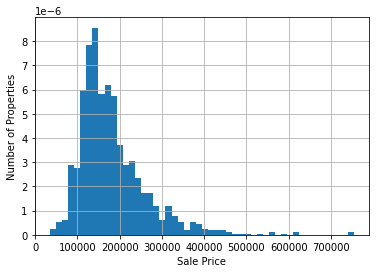

In [6]:
# histogram to evaluate target distribution

data_train['SalePrice'].hist(bins=50, density=True)
plt.ylabel('Number of Properties')
plt.xlabel('Sale Price')
plt.show()

We can see that the distribution is right-skewed. Improve the value spread with mathematical transformation.

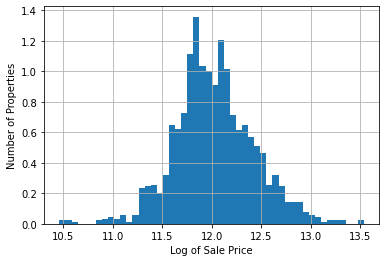

In [7]:
# Transforming the target using logarithm

np.log(data_train['SalePrice']).hist(bins=50, density=True)
plt.ylabel('Number of Properties')
plt.xlabel('Log of Sale Price')
plt.show()

Now the target distribution looks more Gaussian (Normal) distributed.

## Explore Variable Types
Identify categorical and numerical variables

In [8]:
# Categorical variables if dtype of column is equal to Oject "O"
cat_vars = [var for var in data_train.columns if data_train[var].dtype == "O"]

# Add column MSSubClass as Categorical variable
cat_vars = cat_vars + ["MSSubClass"]

# Number of categorical variables in data set
len(cat_vars)

44

In [9]:
# Cast all categorical variables as objects
data_train[cat_vars] = data_train[cat_vars].astype("O")

In [11]:
# Identify numerical variables
num_vars = [var for var in data_train.columns if var not in cat_vars and var != "SalePrice"]

# Number of numerical variables
len(num_vars)

36

## Dealing with Missing Values
Identify Missing/NAN values in data set

In [12]:
# List of column names that have NULL count > 0
vars_with_na = [var for var in data_train.columns if data_train[var].isnull().sum() > 0]

# Determine percentage of missing values
data_train[vars_with_na].isnull().mean().sort_values(ascending=False)

PoolQC          0.995205
MiscFeature     0.963014
Alley           0.937671
Fence           0.807534
FireplaceQu     0.472603
LotFrontage     0.177397
GarageType      0.055479
GarageYrBlt     0.055479
GarageFinish    0.055479
GarageQual      0.055479
GarageCond      0.055479
BsmtExposure    0.026027
BsmtFinType2    0.026027
BsmtFinType1    0.025342
BsmtCond        0.025342
BsmtQual        0.025342
MasVnrArea      0.005479
MasVnrType      0.005479
Electrical      0.000685
dtype: float64

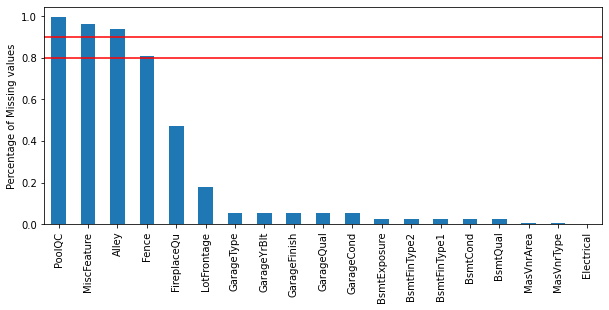

In [14]:
# Plot missing data percentage
data_train[vars_with_na].isnull().mean().sort_values(ascending=False).plot.bar(figsize=(10,4))
plt.ylabel("Percentage of Missing values")
plt.axhline(y=0.90, color='r', linestyle='-')
plt.axhline(y=0.80, color='r', linestyle='-')

plt.show()

In [16]:
# Split cat_vars and num_vars into lists
cat_na = [var for var in cat_vars if var in vars_with_na]
num_na = [var for var in num_vars if var in vars_with_na]

print(cat_na)
print(f"Number of categorical variables with na: {len(cat_na)} \n")

print(num_na)
print(f"Number of numerical variables with na: {len(num_na)}")

['Alley', 'MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature']
Number of categorical variables with na: 16 

['LotFrontage', 'MasVnrArea', 'GarageYrBlt']
Number of numerical variables with na: 3


## Explore Relationship between missing data and sale price
Evaluate the price of house and those obs where data is missing

In [21]:
def analyse_na_value(df, var):
    # make a copy of dataframe
    df = df.copy()

    # interim value to indicate if there are missing values in each row of data
    df[var] = np.where(df[var].isnull(), 1, 0)

    # compare the median sale price in obs where data is missing vs where data is available
    tmp = df.groupby(var)['SalePrice'].agg(['mean', 'std'])

    # plot into a bar graph
    tmp.plot(kind='barh', y='mean', legend=False, xerr='std', title='Sale Price', color='blue')

    plt.show()

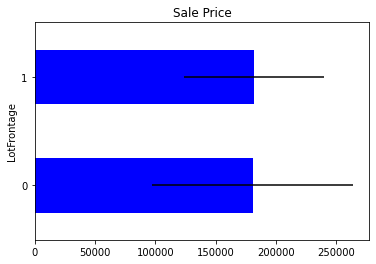

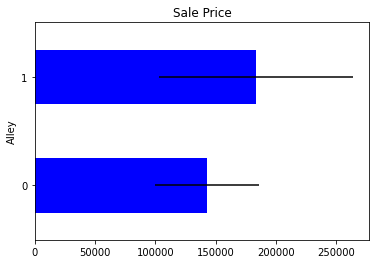

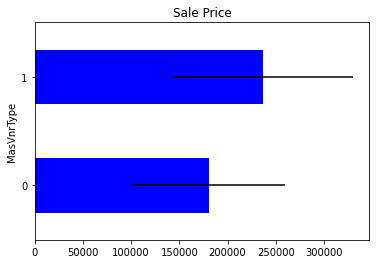

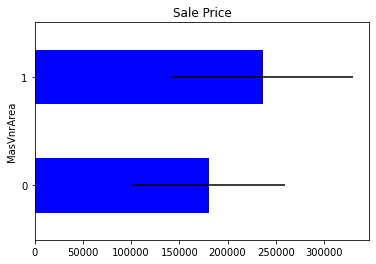

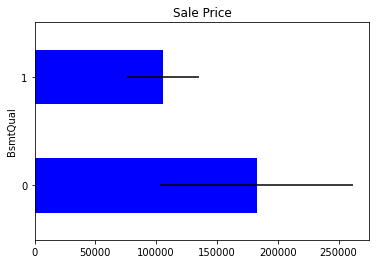

...

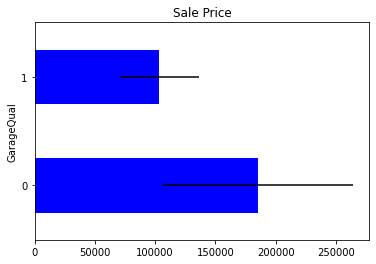

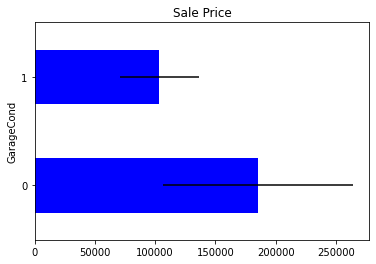

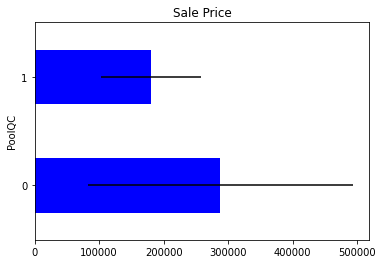

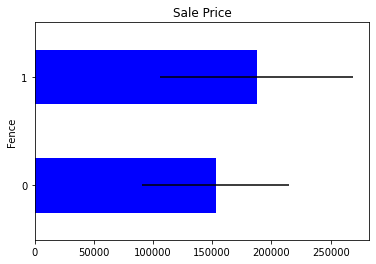

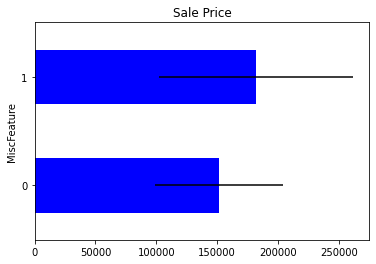

In [22]:
for var in vars_with_na:
    analyse_na_value(data_train, var)

## Temporal Variables
4 year variables in dataset
- YearBuilt
- YearRemod
- GarageYrBlt
- YrSold

In [23]:
# create a list of "year" variables

year_vars = [var for var in num_vars if 'Yr' in var or 'Year' in var]

print(year_vars)

['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']


In [24]:
for var in year_vars:
    print(var, data_train[var].unique())

YearBuilt [2003 1976 2001 1915 2000 1993 2004 1973 1931 1939 1965 2005 1962 2006
 1960 1929 1970 1967 1958 1930 2002 1968 2007 1951 1957 1927 1920 1966
 1959 1994 1954 1953 1955 1983 1975 1997 1934 1963 1981 1964 1999 1972
 1921 1945 1982 1998 1956 1948 1910 1995 1991 2009 1950 1961 1977 1985
 1979 1885 1919 1990 1969 1935 1988 1971 1952 1936 1923 1924 1984 1926
 1940 1941 1987 1986 2008 1908 1892 1916 1932 1918 1912 1947 1925 1900
 1980 1989 1992 1949 1880 1928 1978 1922 1996 2010 1946 1913 1937 1942
 1938 1974 1893 1914 1906 1890 1898 1904 1882 1875 1911 1917 1872 1905]
YearRemodAdd [2003 1976 2002 1970 2000 1995 2005 1973 1950 1965 2006 1962 2007 1960
 2001 1967 2004 2008 1997 1959 1990 1955 1983 1980 1966 1963 1987 1964
 1972 1996 1998 1989 1953 1956 1968 1981 1992 2009 1982 1961 1993 1999
 1985 1979 1977 1969 1958 1991 1971 1952 1975 2010 1984 1986 1994 1988
 1954 1957 1951 1978 1974]
GarageYrBlt [2003. 1976. 2001. 1998. 2000. 1993. 2004. 1973. 1931. 1939. 1965. 2005.
 1962. 2006.

Text(0, 0.5, 'Median House Price')

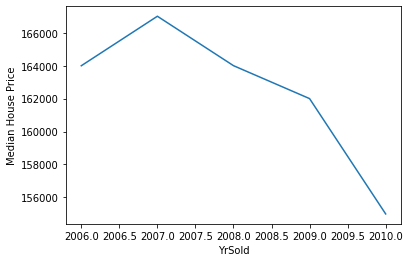

In [26]:
# plot median sale price vs year in which it was sold

data_train.groupby('YrSold')['SalePrice'].median().plot()
plt.ylabel('Median House Price')

Median of sale price has been dropping over the years

Text(0, 0.5, 'Median House Price')

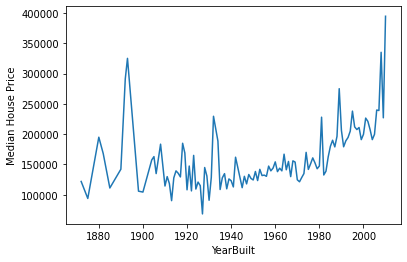

In [28]:
# plot median sale price vs year in which it was sold

data_train.groupby('YearBuilt')['SalePrice'].median().plot()
plt.ylabel('Median House Price')

Newer houses tend to sell for much higher median price than older houses

In [29]:
def analyse_year_vars(df, var):
    df = df.copy()

    # Capture the difference betweena year variable and year in which house was sold
    df[var] = df['YrSold'] - df[var]

    df.groupby('YrSold')[var].median().plot()
    plt.ylabel('Time from ' + var)
    
    plt.show()


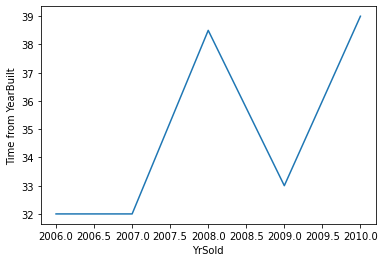

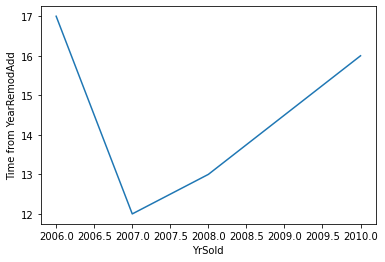

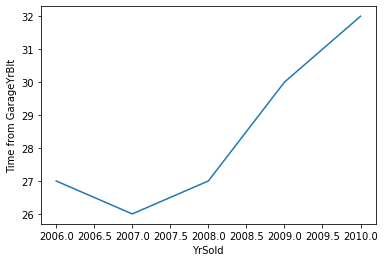

In [30]:
for var in year_vars:
    if var != 'YrSold':
        analyse_year_vars(data_train, var)

## Discrete Variables
Variables with finite set of number values (< 20)

In [31]:
# Create a list of discrete variables
discrete_vars = [var for var in num_vars if len(data_train[var].unique()) < 20 and var not in year_vars]

print(f'Number of discrete variables: {len(discrete_vars)}')

Number of discrete variables: 13


In [32]:
data_train[discrete_vars].head()

,OverallQual,OverallCond,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,PoolArea,MoSold
0,7,5,1,0,2,1,3,1,8,0,2,0,2
1,6,8,0,1,2,0,3,1,6,1,2,0,5
2,7,5,1,0,2,1,3,1,6,1,2,0,9
3,7,5,1,0,1,0,3,1,7,1,3,0,2
4,8,5,1,0,2,1,4,1,9,1,3,0,12


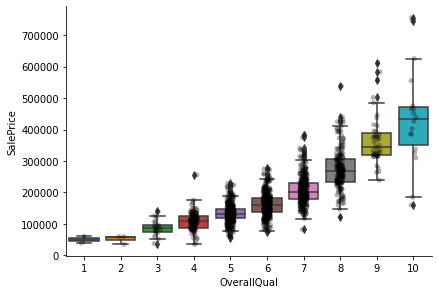

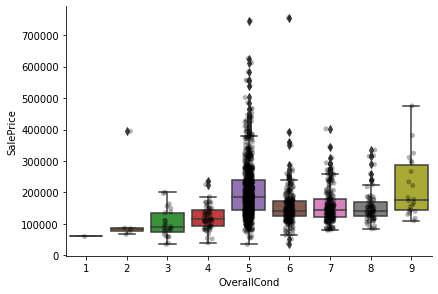

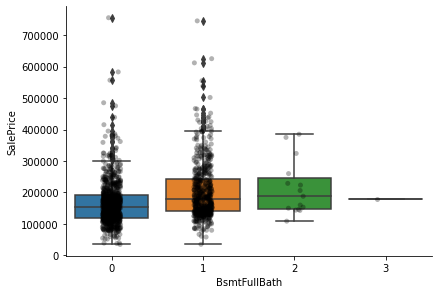

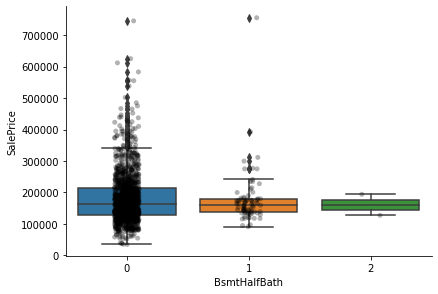

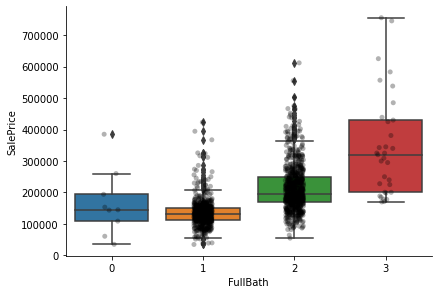

...

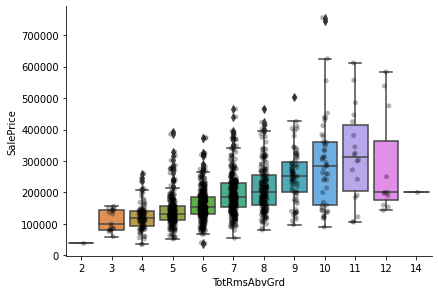

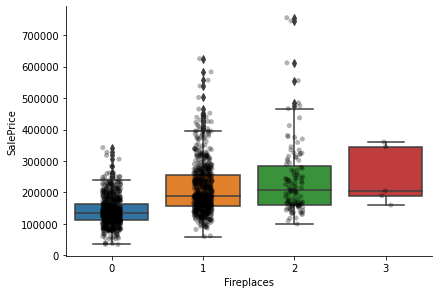

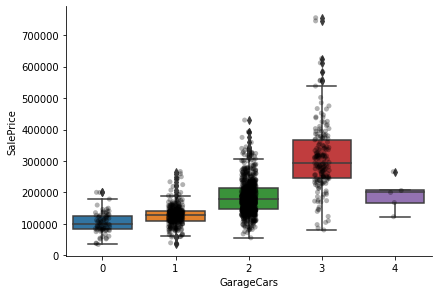

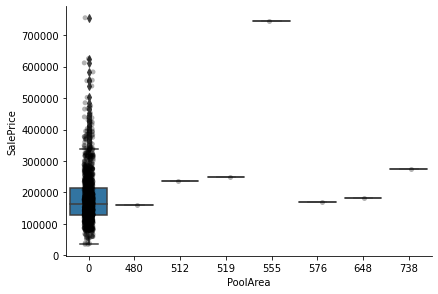

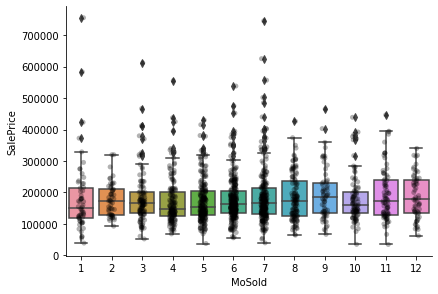

In [34]:
for var in discrete_vars:
    sns.catplot(x=var, y='SalePrice', data=data_train, kind='box', height=4, aspect=1.5)
    sns.stripplot(x=var, y='SalePrice', data=data_train, jitter=0.1, alpha=0.3, color='k')
    plt.show()

## Continuous Variables
Explore the distributions of continuous variables

In [35]:
cont_vars = [var for var in num_vars if var not in discrete_vars + year_vars]

print(f"Number of continuous variables: {len(cont_vars)}")

Number of continuous variables: 19


In [36]:
data_train[cont_vars]

,Id,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal
0,1,65.0,8450,196.0,706,0,150,856,856,854,0,1710,548,0,61,0,0,0,0
1,2,80.0,9600,0.0,978,0,284,1262,1262,0,0,1262,460,298,0,0,0,0,0
2,3,68.0,11250,162.0,486,0,434,920,920,866,0,1786,608,0,42,0,0,0,0
3,4,60.0,9550,0.0,216,0,540,756,961,756,0,1717,642,0,35,272,0,0,0
4,5,84.0,14260,350.0,655,0,490,1145,1145,1053,0,2198,836,192,84,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,62.0,7917,0.0,0,0,953,953,953,694,0,1647,460,0,40,0,0,0,0
1456,1457,85.0,13175,119.0,790,163,589,1542,2073,0,0,2073,500,349,0,0,0,0,0
1457,1458,66.0,9042,0.0,275,0,877,1152,1188,1152,0,2340,252,0,60,0,0,0,2500
1458,1459,68.0,9717,0.0,49,1029,0,1078,1078,0,0,1078,240,366,0,112,0,0,0


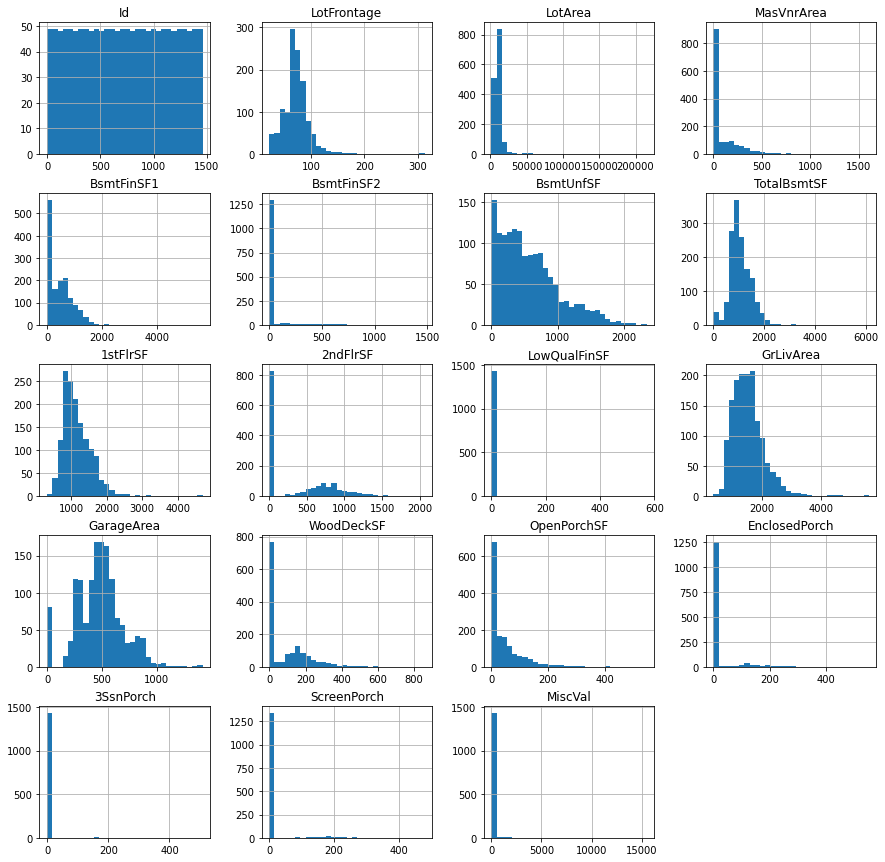

In [37]:
# Plot histograms of all continuous variables
data_train[cont_vars].hist(bins=30, figsize=(15, 15))
plt.show()

In [39]:
# list of super skewed variables

skewed = ['BsmtFinSF2', 'LowQualFinSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'MiscVal']

# remaining continuous variables

cont_vars = [
    'LotFrontage',
    'LotArea',
    'MasVnrArea',
    'BsmtFinSF1',
    'BsmtUnfSF',
    'TotalBsmtSF',
    '1stFlrSF',
    '2ndFlrSF',
    'GrLivArea',
    'GarageArea',
    'WoodDeckSF',
    'OpenPorchSF'
]

## Yeo-Johnson Transformation

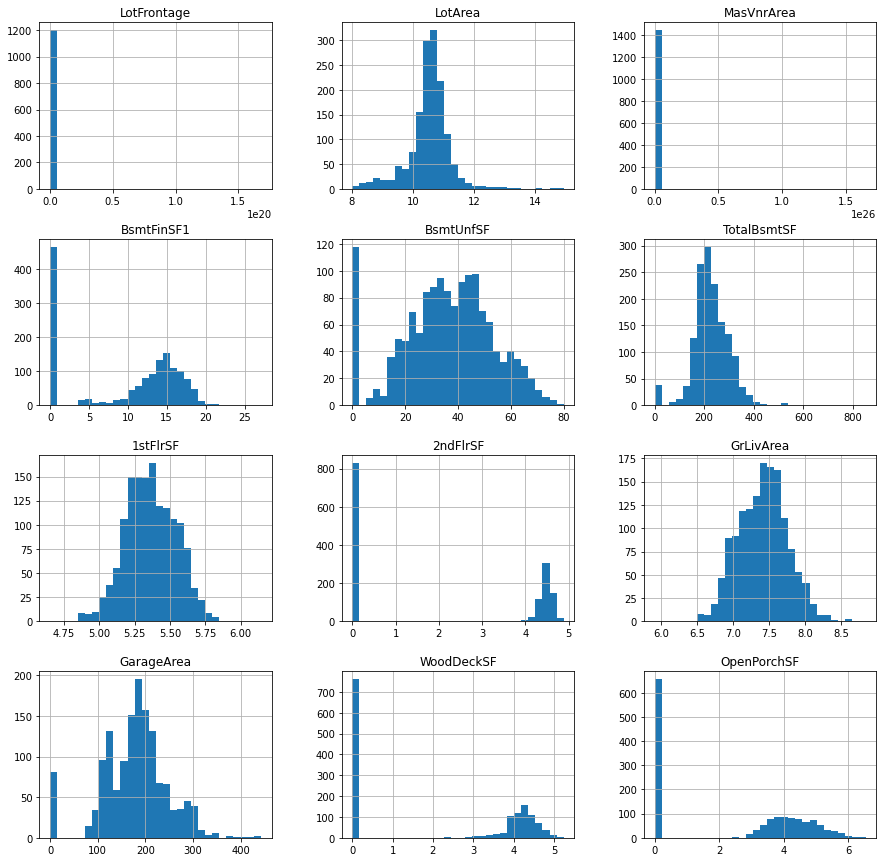

In [42]:
tmp = data_train.copy()

for var in cont_vars:
    # transform the variable - yeo-johnson
    tmp[var], param = stats.yeojohnson(data_train[var])

# plot histograms of transformed variables
tmp[cont_vars].hist(bins=30, figsize=(15, 15))
plt.show()

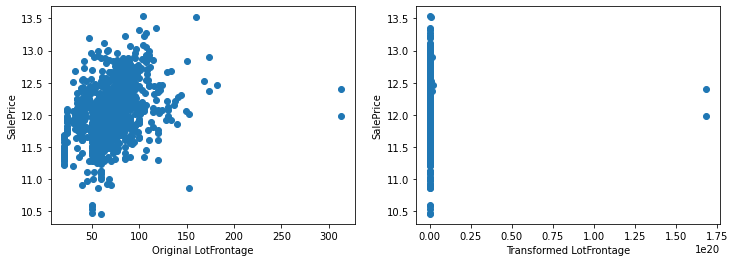

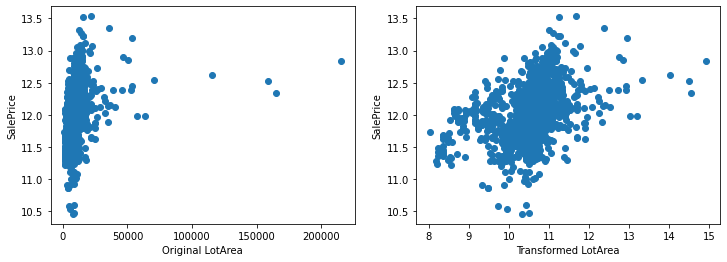

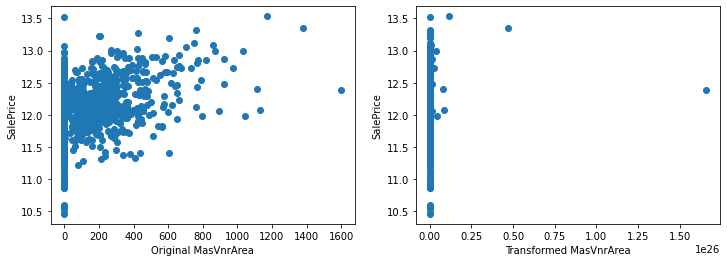

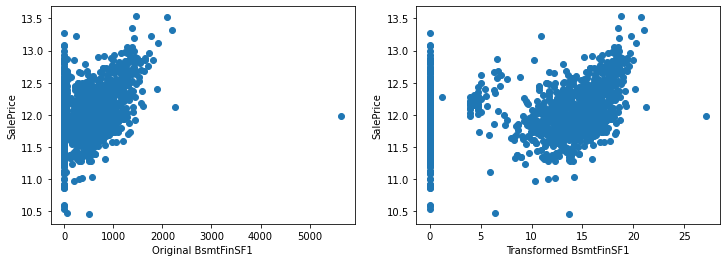

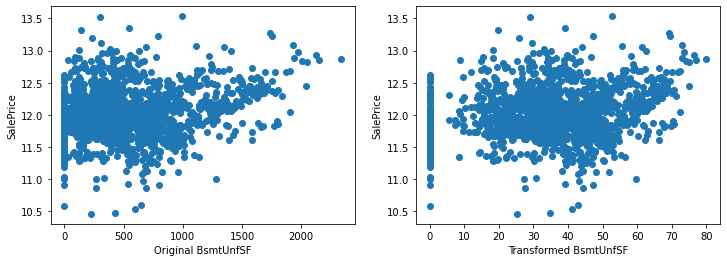

...

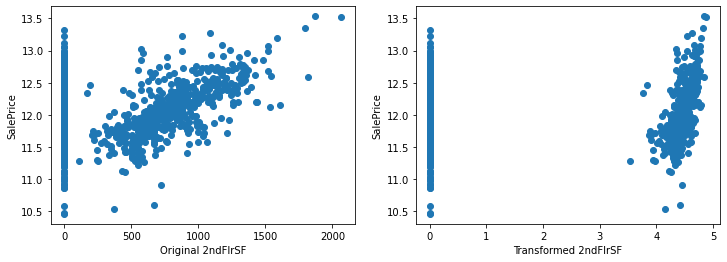

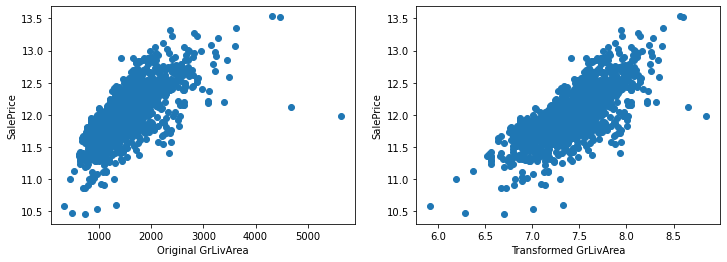

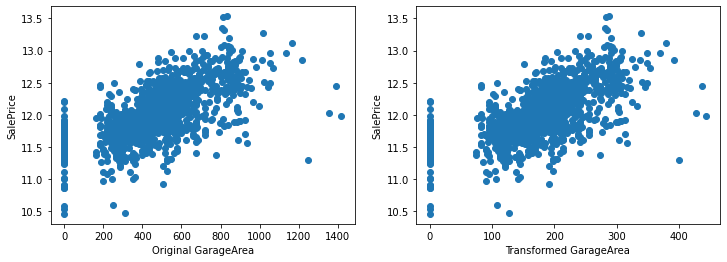

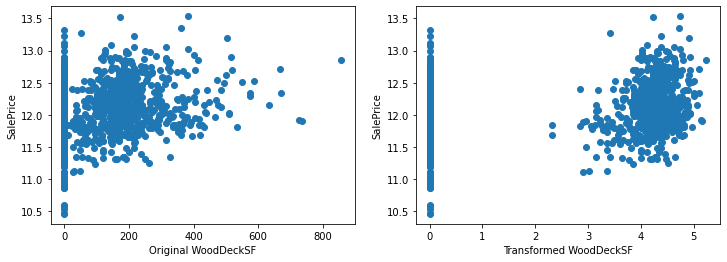

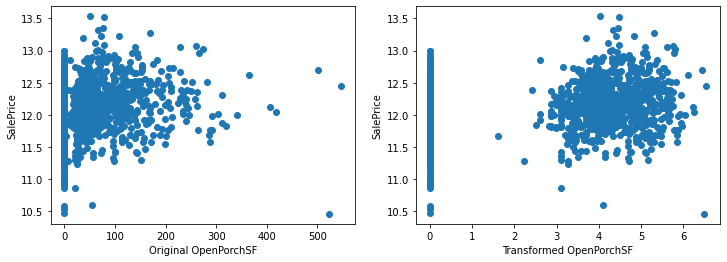

In [43]:
# plot the original and transformed variables side-by-side

for var in cont_vars:
    plt.figure(figsize=(12, 4))

    # plot original vars against sale price
    plt.subplot(1, 2, 1)
    plt.scatter(data_train[var], np.log(data_train['SalePrice']))
    plt.ylabel('SalePrice')
    plt.xlabel('Original ' + var)

    # plot transformed vars against sale price
    plt.subplot(1, 2, 2)
    plt.scatter(tmp[var], np.log(tmp['SalePrice']))
    plt.ylabel('SalePrice')
    plt.xlabel('Transformed ' + var)

    plt.show()


## Skewed variables
Transform skewed variables and label them with binary to analyse how predictive they are

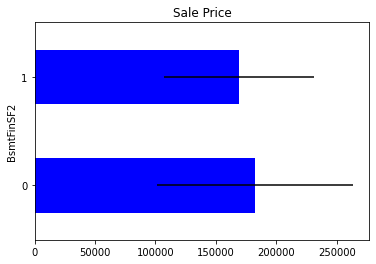

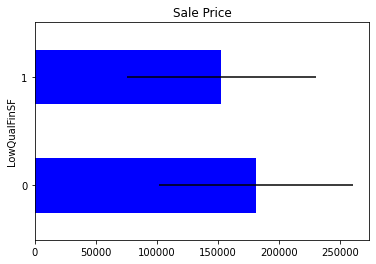

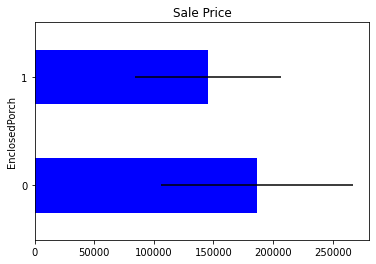

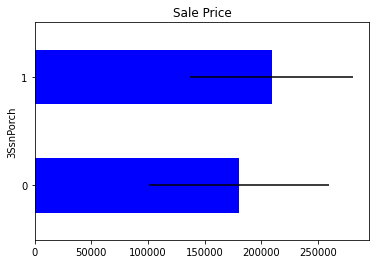

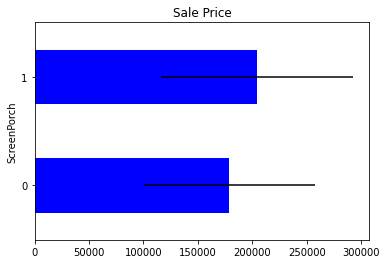

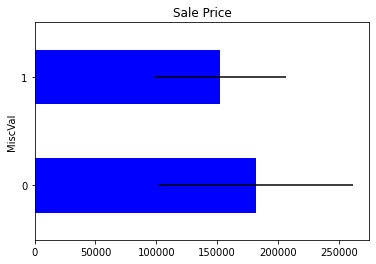

In [45]:
for var in skewed:
    tmp = data_train.copy()

    # map the variable values into 0 or 1
    tmp[var] = np.where(tmp[var]  == 0, 0, 1)

    # determine mean sale price in the mapped values
    tmp = tmp.groupby(var)['SalePrice'].agg(['mean', 'std'])

    # plot into a bar graph
    tmp.plot(kind='barh', y='mean', legend=False, xerr='std', title='Sale Price', color='blue')

    plt.show()